# **Training Stable Diffusion Model with DreamBooth Technique**

* It is a technique that can update the whole weights of diffusion model with using only a couple of images.
* These images can teach the model an object or a style.
* This notebook is on [train_dreambooth.py](https://github.com/huggingface/diffusers/blob/main/examples/dreambooth/train_dreambooth.py) script from the diffusers library developed by HuggingFace!


## **1. Setup**

* Change the runtime type as GPU.
* Check the memory size, it should be at least 12GB for this notebook

In [6]:
#@title GPU Check
!nvidia-smi

Fri Jan 12 15:03:33 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [7]:
#@title Install Diffusers Library
#@markdown - **ipywidgets** for visualization
#@markdown - Clone the **Diffusers** library from HuggingFace
#@markdown - Install with **setup.py** file inside the library
#@markdown - Installation process checks and installs the **required** libraries for Diffusers

%%capture
!pip install -qq "ipywidgets>=7,<8"
!git clone https://github.com/huggingface/diffusers
%cd /content/diffusers
!pip install .

In [8]:
#@title Install DreamBooth Method Requirements
#@markdown - Install the required libraries for DreamBooth Method
#@markdown - Install **wandb** for reporting
#@markdown - Install **bitsandbytes** to be able to use Adam optimizer with 8 bit option (memory efficient)
#@markdown - Install **gradio** and dependencies for Demo UI

%%capture
%cd /content/diffusers/examples/dreambooth
!pip install -r requirements.txt
!pip install wandb
!pip install bitsandbytes
!pip install transformers gradio ftfy accelerate
import gradio

In [ ]:
#@title xFormers Library
#@markdown - Install **xformers** to make attentions more memory efficient

#@markdown When xformers library installed (~ 3-5 mins), when the pytorch version changes sometimes runtime restart needed. If needed, restart runtime and run this cell again and continue from here. If only gives pip dependency resolver error, ignore that.

!pip install xformers

## **2.Datasets**

In [1]:
#@title Create a folder for Custom Datasets
#@markdown This folder is for preparing the **instance** and **class** images.
import os
%cd /content

if os.path.exists("/content/custom_dataset"):
    print("Removing existing custom_dataset folder")
    !rm -rf /content/custom_dataset

print("Creating new custom_dataset folder")
!mkdir /content/custom_dataset
!mkdir /content/custom_dataset/class_images
!mkdir /content/custom_dataset/instance_images

print('Custom Dataset folder is created: /content/custom_dataset')

/content
Creating new custom_dataset folder
Custom Dataset folder is created: /content/custom_dataset


In [2]:
#@title Utils for Dataset Preprocessing
#@markdown * Resize and crop function
#@markdown * Function to show images in a one row

from PIL import Image
import os
import IPython.display as display
import matplotlib.pyplot as plt

def resize_and_crop_images(folder_path, target_size=512):
    """
    Resize the images in a folder to have a smaller edge of the specified target size and display them.

    Parameters:
    - folder_path (str): Path to the folder containing the images.
    - target_size (int): Desired size for the smaller edge (default is 512).
    """
    # Iterate through all files in the folder
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)

        # Check if the file is an image
        if os.path.isfile(file_path) and filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
            # Open the image
            image = Image.open(file_path)

            # Get the original width and height
            width, height = image.size

            # Calculate the new size while maintaining the aspect ratio
            if width <= height:
                new_width = target_size
                new_height = int(height * (target_size / width))
            else:
                new_width = int(width * (target_size / height))
                new_height = target_size

            # Resize the image
            resized_image = image.resize((new_width, new_height))

            left = (new_width - target_size) // 2
            top = (new_height - target_size) // 2
            right = (new_width + target_size) // 2
            bottom = (new_height + target_size) // 2

            # Perform the center crop
            cropped_image = resized_image.crop((left, top, right, bottom))
            cropped_image.save(file_path)

def show_images_in_one_row(folder_path, target_size=256):
    images = []

    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path) and filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
            img = Image.open(file_path)
            img = img.resize((target_size, int(target_size * img.size[1] / img.size[0])))
            images.append(img)

    # Display images in one row
    fig, axes = plt.subplots(1, len(images), figsize=(len(images) * 3, 3))
    for ax, img in zip(axes, images):
        ax.imshow(img)
        ax.axis('off')
    plt.show()

### Class Images (Optional)
* It is optional because if any image is uploaded, the model **generates** class images itself at the beginning with a given number of amount.
* **Upload** your images into the **class_images**.
* Images that belong to the related class.
* No need to belong to the specific object or style.

Example case: Dog images for dog class

---


![](https://woofwell.com/cdn/shop/files/Golden-Retriever-Health-WoofWell-Breed-Specific-Dog-Supplements_1600x.jpg?v=1621360789)
![](https://bernesemountaindogcoffeecompany.com/cdn/shop/files/bernese.web_256x256.png?v=1681263691)
![](https://fablepets.com/cdn/shop/files/IG_carousel_artieandbrody_256x256_c0a7306d-7b43-4d6a-ad16-7deef04fdc47.png?v=1652401112)

In [3]:
#@title Resize class images to 512x512 for diffusion model
folder_path = '/content/custom_dataset/class_images' #@param {type:"string"}

if len(os.listdir(folder_path)):
  resize_and_crop_images(folder_path)
  show_images_in_one_row(folder_path)

### Instance Images
* **Upload** your images into the **instance_images** folder
* Images that belong to the **selected object** or **selected style**.

Example case: Images of selected subject dog (you can upload 5-6 images for instance)

---

![](https://keras.io/img/examples/generative/dreambooth/dreambooth_16_0.png)

In [ ]:
#@title Resize instance images to 512x512 for diffusion model

folder_path = '/content/custom_dataset/instance_images' #@param {type:"string"}
resize_and_crop_images(folder_path)

show_images_in_one_row(folder_path)

## **3. Training** Fine-tuning of Stable Diffusion with DreamBooth Method

In [ ]:
#@title Create an output folder for saving the results and checkpoints

if os.path.exists("/content/outputs"):
    print("Removing existing outputs folder")
    !rm -rf /content/outputs

print("Creating new outputs folder")
!mkdir /content/outputs

print('Output folder is created: /content/outputs')

Creating new outputs folder
Output folder is created: /content/outputs


In [ ]:
#@title Train the Diffusion Model!
#@markdown This is a demo training, hyperparameters are not tuned. It can take 20 minutes to train.
#@markdown - First step, the model generates class images into **/content/custom_dataset/class_images** folder
#@markdown - Second step, connecting the **wandb**. It will be different options for login and authorize.
#@markdown - Third step, **training**. Model is iterating on class images and instance images to learn the uniquely identified object or style. It will generate validation examples each N steps.
#@markdown - Final step is **logging** everything to the wandb and save final checkpoints to the **/content/outputs** folder.

%cd /content/diffusers/examples/dreambooth

!python train_dreambooth.py --pretrained_model_name_or_path 'runwayml/stable-diffusion-v1-5' \
                            --revision "fp16" \
                            --instance_data_dir '/content/custom_dataset/instance_images' \
                            --class_data_dir '/content/custom_dataset/class_images' \
                            --instance_prompt 'A photo of a zhr dog' \
                            --class_prompt 'A photo of a dog' \
                            --with_prior_preservation \
                            --prior_loss_weight 1.0 \
                            --num_class_images 10 \
                            --output_dir '/content/outputs' \
                            --resolution 512 \
                            --train_text_encoder \
                            --train_batch_size 2 \
                            --sample_batch_size 2 \
                            --max_train_steps 400 \
                            --checkpointing_steps 200 \
                            --gradient_accumulation_steps 1 \
                            --gradient_checkpointing \
                            --learning_rate 1e-6 \
                            --lr_scheduler 'constant' \
                            --lr_warmup_steps=0 \
                            --use_8bit_adam \
                            --validation_prompt 'A photo of a zhr dog' \
                            --num_validation_images 4 \
                            --mixed_precision="fp16" \
                            --enable_xformers_memory_efficient_attention \
                            --set_grads_to_none \
                            #--report_to 'wandb'

## **4. Inference** Using Finetuned Model

In [ ]:
#@title Load the trained model

from diffusers import DiffusionPipeline, UNet2DConditionModel
from transformers import CLIPTextModel
import torch
import os

trained_model_path = '/content/outputs' #@param

unet = UNet2DConditionModel.from_pretrained(trained_model_path + '/unet')
text_encoder = CLIPTextModel.from_pretrained(trained_model_path + '/text_encoder')

pipeline = DiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", unet=unet, text_encoder=text_encoder, dtype=torch.float16,
).to("cuda")

In [ ]:
#@title Demo with Gradio UI for Inference
#@markdown The demo can be opened also in **other tab** on your browser or from another **computer** with given public url.
#@markdown - **Prompt:** Prompt for generation
#@markdown - **Negative Prompt:** Prevent generation from that prompt
#@markdown - **Samples:** Number of images that will be generated
#@markdown - **Guidance Scale:** It can be said as a coefficient for tune the power of the prompt on the generated images.
#@markdown - **Inference Steps:** How many iteration steps while denoising? If the generated images are noisy, try to increase this parameter.
#@markdown - **Height and Width:** Highly recommended 512
#@markdown - **RUN!**

import gradio as gr

def inference(prompt, num_samples, negative_prompt, guidance_scale, num_inference_steps, height, width):
    all_images = []
    images = pipeline(
        prompt,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=num_samples,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale
    ).images
    all_images.extend(images)
    return all_images

with gr.Blocks() as demo:
    gr.HTML("<h2 style=\"font-size: 2em; font-weight: bold\" align=\"center\">Stable Diffusion Dreambooth - Run Concept</h2>")
    with gr.Row():
        with gr.Column():
            prompt = gr.Textbox(label="Prompt")
            negative_prompt = gr.Textbox(label="Negative Prompt")
            samples = gr.Slider(label="Samples", value=1, maximum=12)
            guidance_scale = gr.Slider(label="Guidance Scale", value=7.5, maximum=30)
            num_inference_steps = gr.Slider(label="Inference Steps", value=50, maximum=500)
            height = gr.Slider(label="Height", value=512)
            width = gr.Slider(label="Width", value=512)
            run = gr.Button(value="Run")
        with gr.Column():
            gallery = gr.Gallery(show_label=False)

    run.click(inference, inputs=[prompt, samples, negative_prompt, guidance_scale, num_inference_steps, height, width], outputs=gallery)
    gr.Examples([["a photo of sks dog riding a bicycle", 1, "", 7.5, 150, 512, 512]], [prompt, samples, negative_prompt, guidance_scale, num_inference_steps, height, width], gallery, inference, cache_examples=False)

demo.launch(debug=True)

## **Example Results**

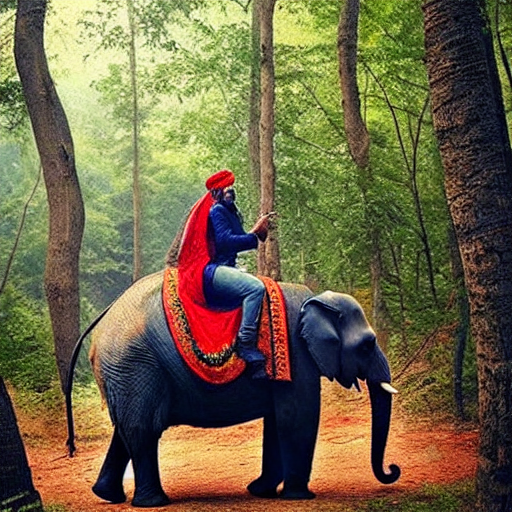

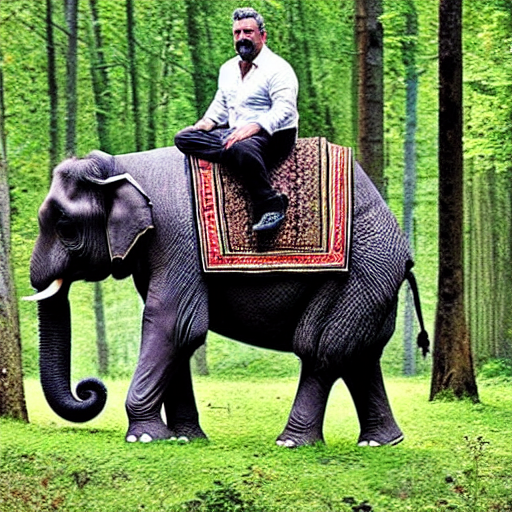

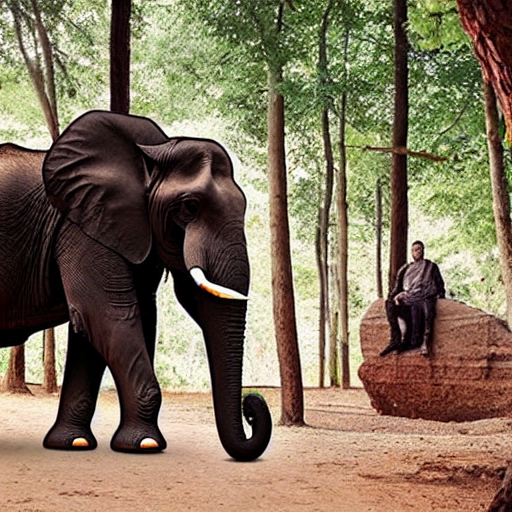

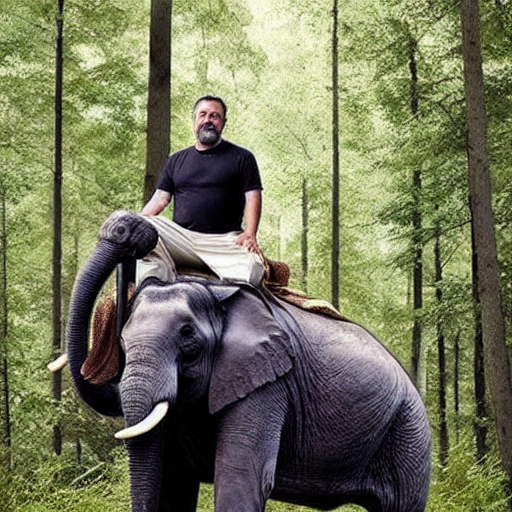

In [ ]:
#@title "zhr man in the forest on the elephant with bedouin clothes"

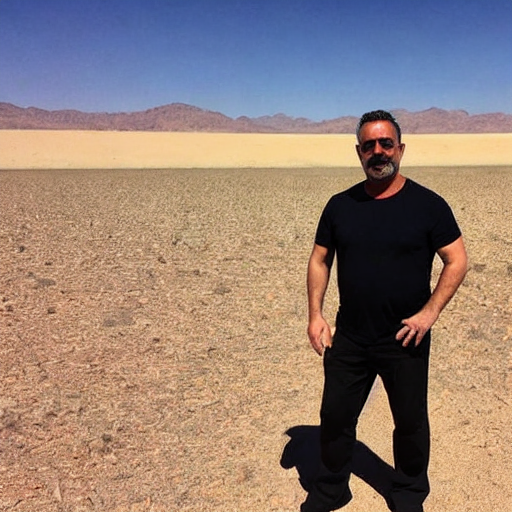

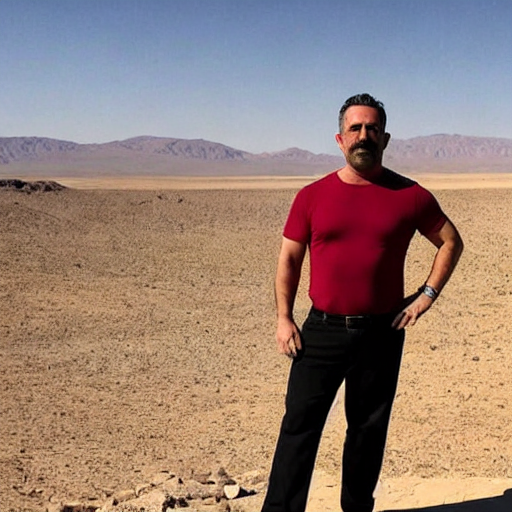

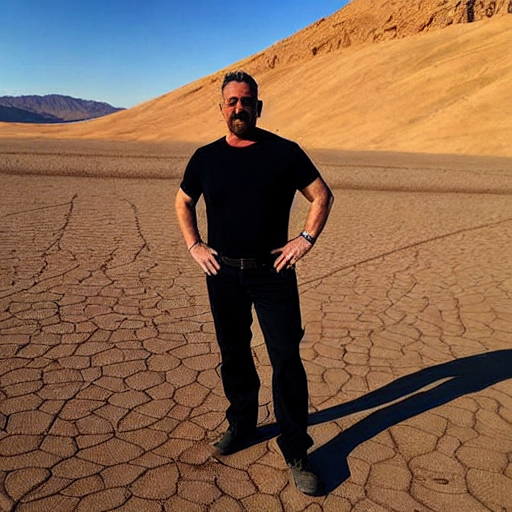

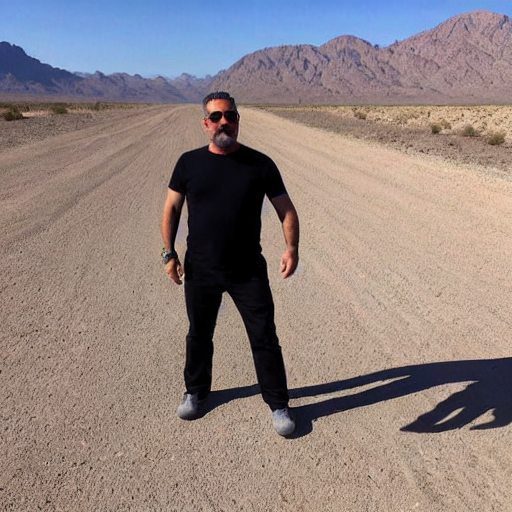

In [ ]:
#@title "zhr man in the dessert"

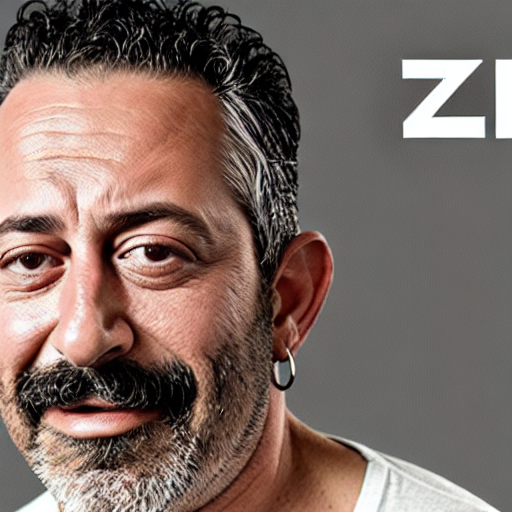

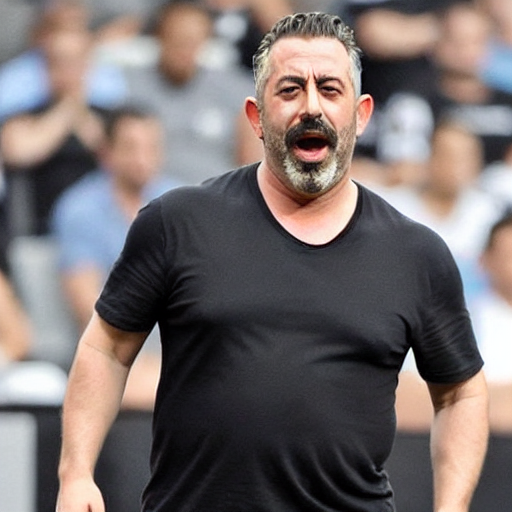

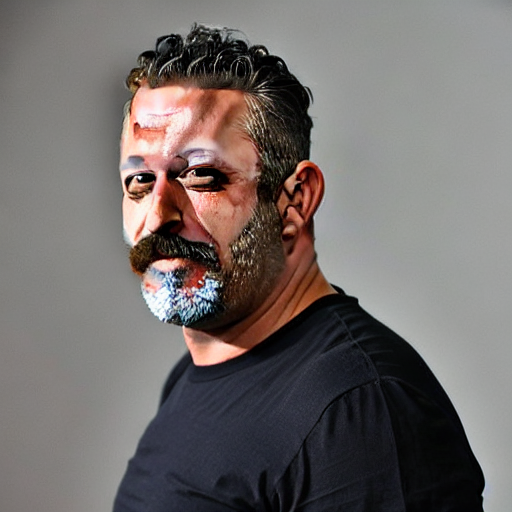

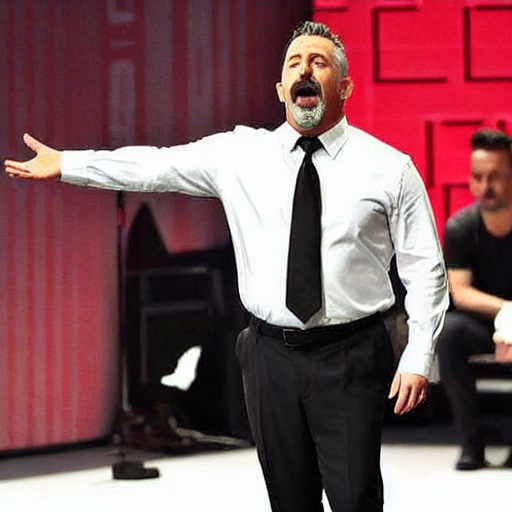

In [ ]:
#@title "zhr man is screaming"

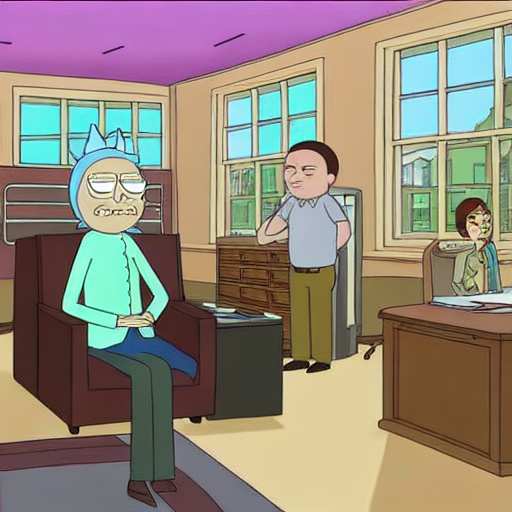

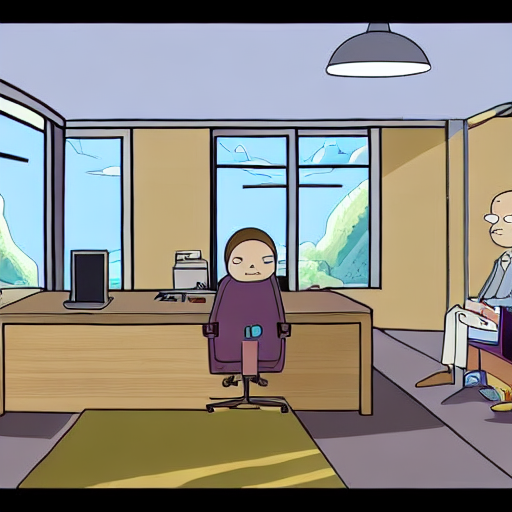

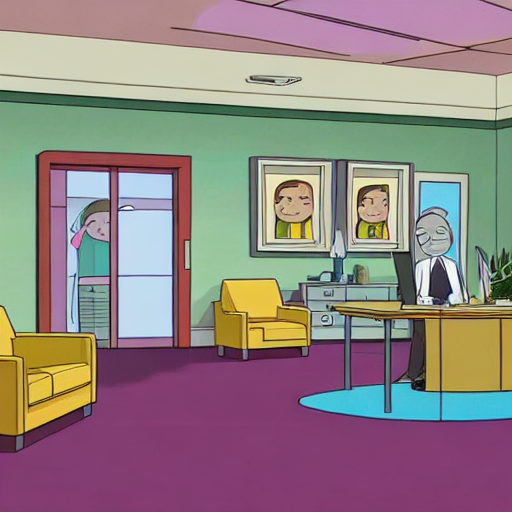

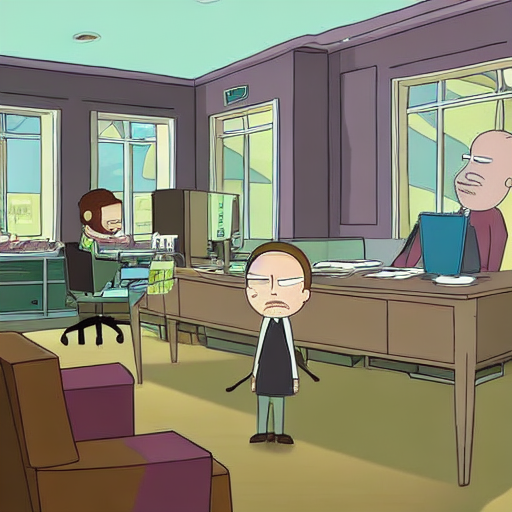

In [ ]:
#@title "a luxury office in zhr cartoon style"

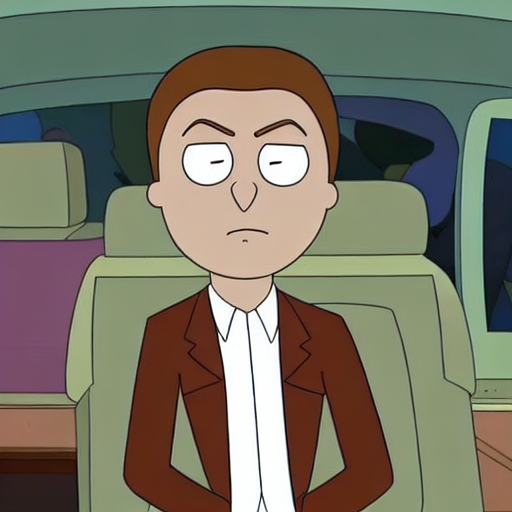

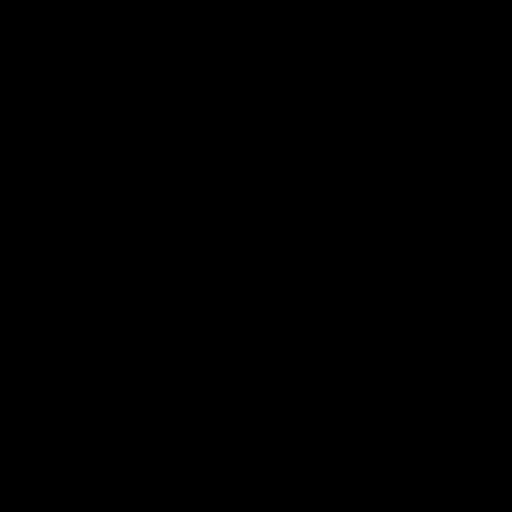

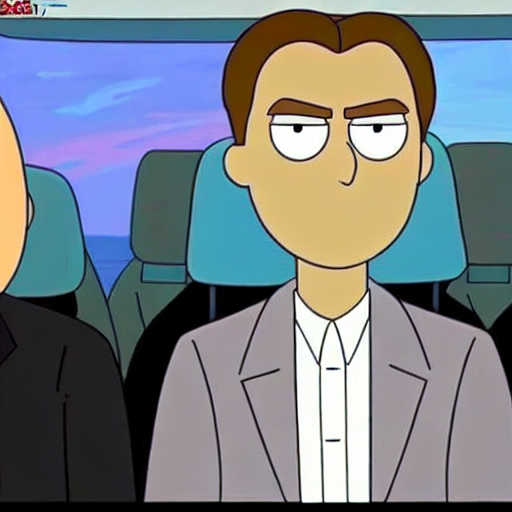

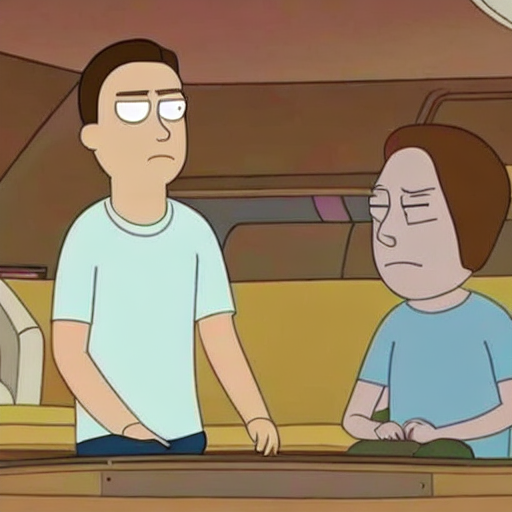

In [ ]:
#@title "Leonardo diCaprio in zhr cartoon style"

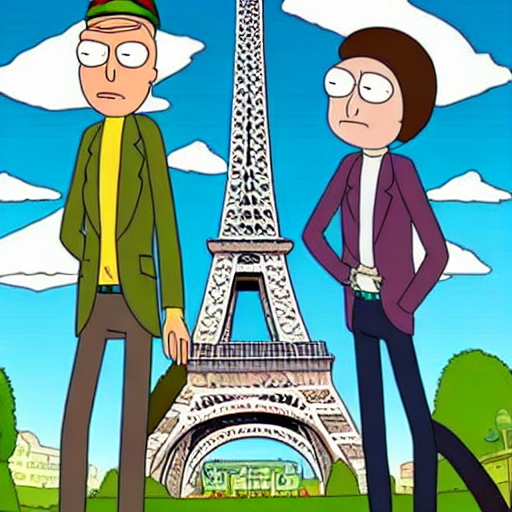

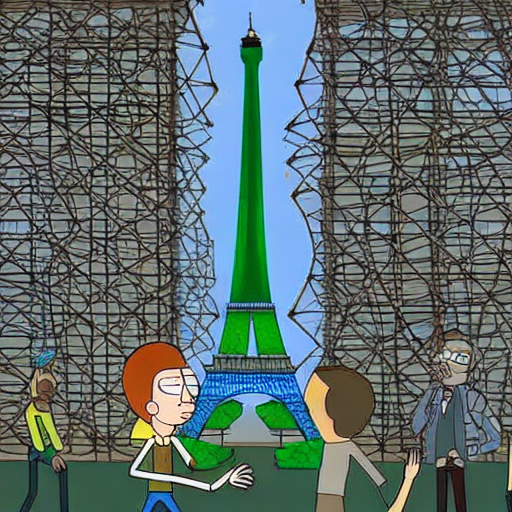

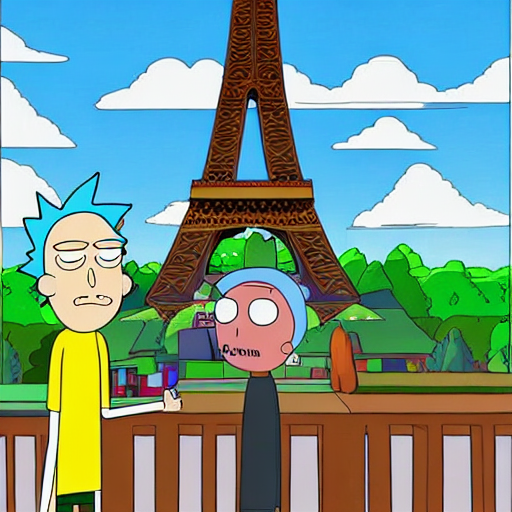

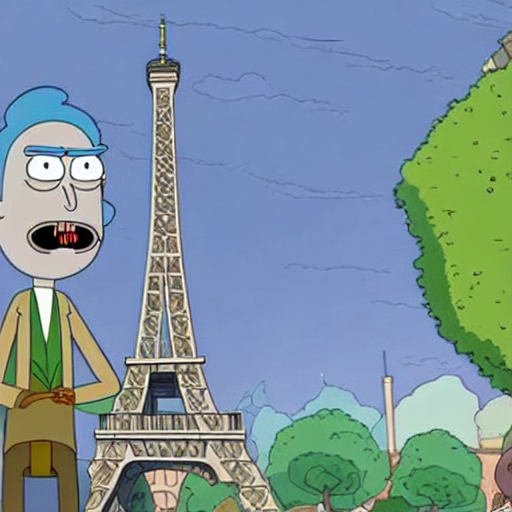

In [ ]:
#@title "Paris Eiffel Tower in zhr cartoon style"

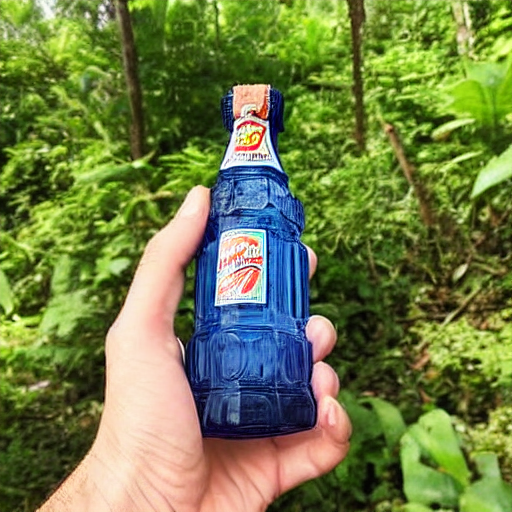

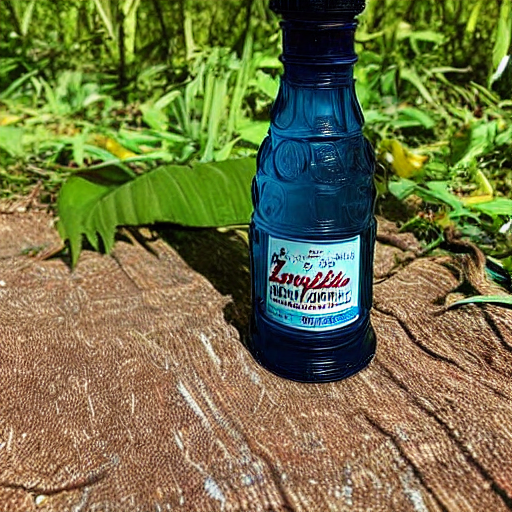

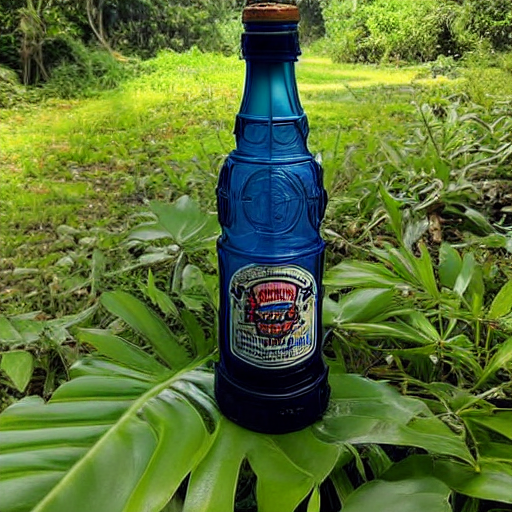

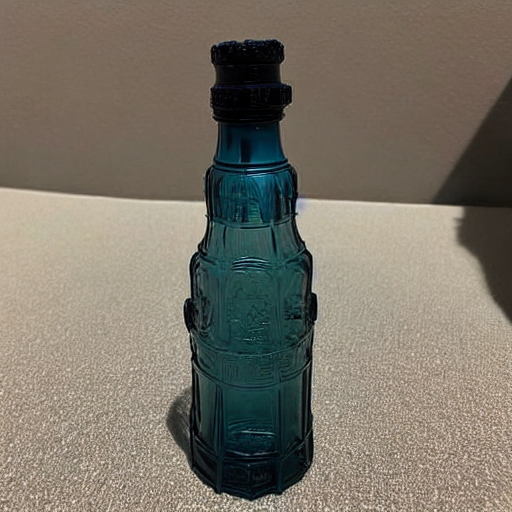

In [ ]:
#@title "zhr perfume bottle in the jungle"

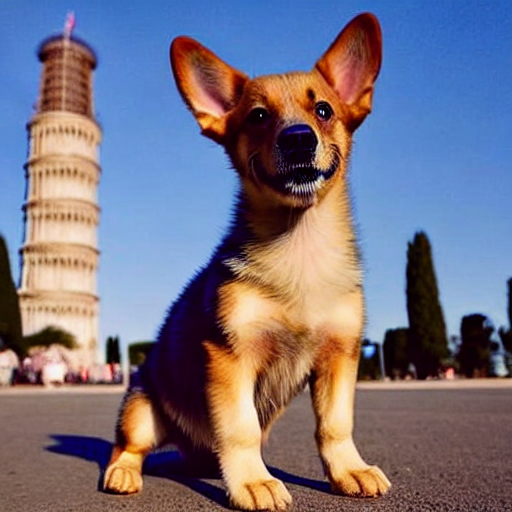

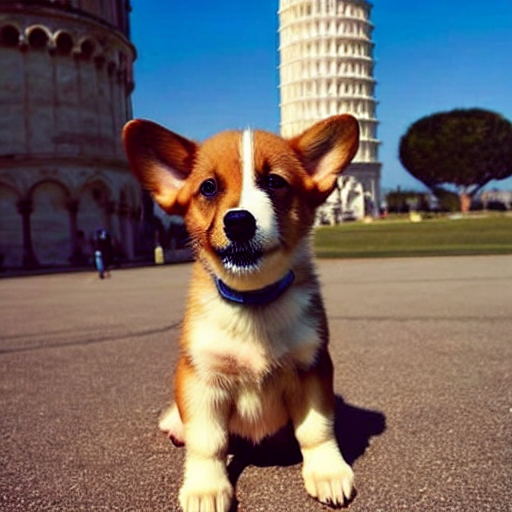

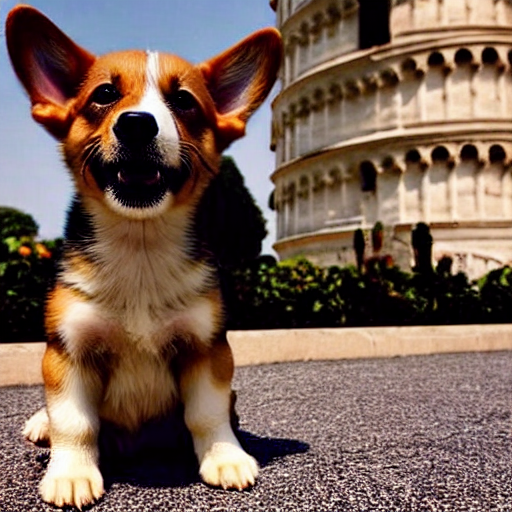

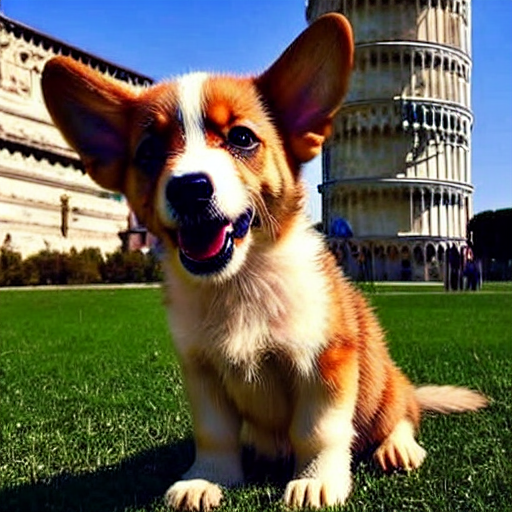

In [ ]:
#@title "zhr dog in front of the Pisa Tower"

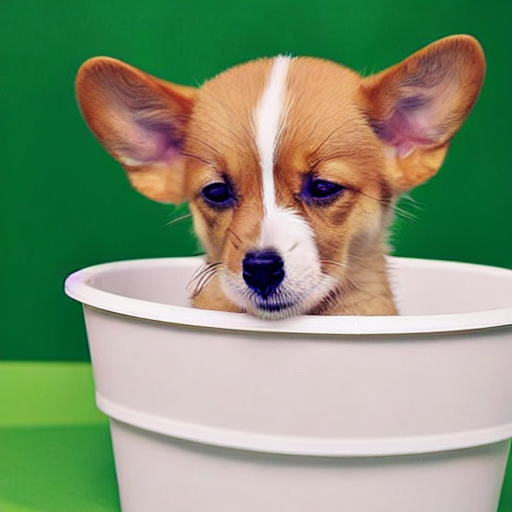

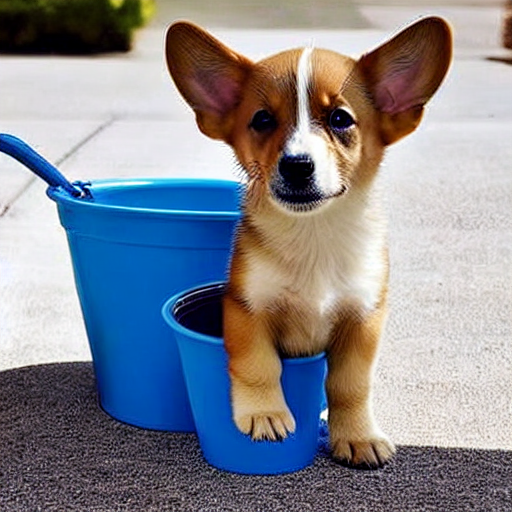

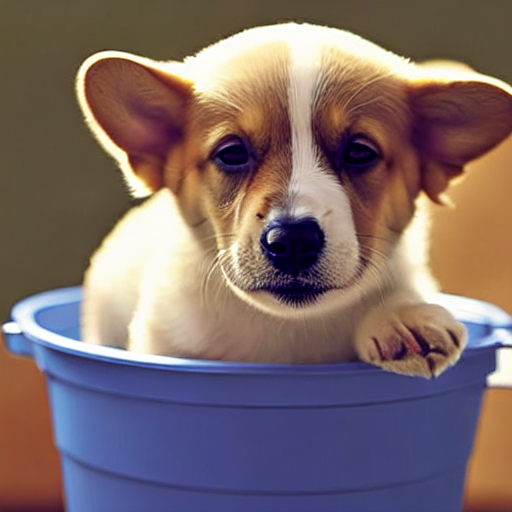

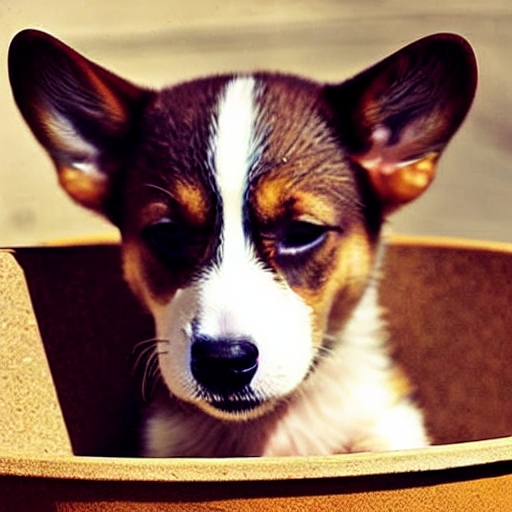

In [ ]:
#@title "A photo of zhr dog in the bucket"